## Activity 2 - Develop a second-degree Polynomial Regression for dataset D
* Uses a typical 2nd-order polynomial expression, specified in prompt
* Supplies us with an initialized weight vector.
* Uses Maximum Likelihood Estimation (specifically log likelihood, for easier computation) to tune the weights to generate a more accurate regression. Gradient Descent combined with the partial derivative of this MLE. 

In [112]:
# Call in relevant libaries
import numpy as np
import pandas as pd

# Feature Matrix, Actual Y Matrix, and Predicted Y Matrix

In [113]:
# Populate the dataset
dataset_D = np.array([[3, 2], [5, 12], [8, 8], [7, 10], [4, 4], [2, 2]])

# Create a vector of the x-values, and actual y's, from the dataset
x_attr = np.vstack(dataset_D[:, 0])
actual_y = np.vstack(dataset_D[:, 1])

# Put together the feature matrix
feature_matrix = np.stack((np.ones((6, 1)), x_attr, np.square(x_attr)), axis = -1)

# Reshape to 2D for dataframe
feature_matrix = feature_matrix.reshape((feature_matrix.shape[0]*feature_matrix.shape[1]), feature_matrix.shape[2])

# Now, we can make it a dataframe! This is for nice printout!
feature_matrix_DF = pd.DataFrame(feature_matrix, columns = ['x0', 'x1', 'x2'])
print(f"Feature Matrix of Polynomial given D: \n{feature_matrix_DF}\n")     

# Actual output
print(f"Actual Y Vector given D: \n{actual_y}\n") 

# Predicted output
w_coeff = np.array([0.1, 0.2, 0.3])
pred_y = np.empty([6, 1])
for i in range(0, actual_y.shape[0]):
    # Calculate each predicted y, using the 2nd-order polynomial regression given: initialized weights, and the appropriate X for each term
    pred_y[i][0] = w_coeff[0] * feature_matrix[i][0] + w_coeff[1] * feature_matrix[i][1] + w_coeff[2] * feature_matrix[i][2]

# Predicted matrix printout
print(f"Predicted Y Vector given D and Initialized Weights: \n{pred_y}\n") 

Feature Matrix of Polynomial given D: 
    x0   x1    x2
0  1.0  3.0   9.0
1  1.0  5.0  25.0
2  1.0  8.0  64.0
3  1.0  7.0  49.0
4  1.0  4.0  16.0
5  1.0  2.0   4.0

Actual Y Vector given D: 
[[ 2]
 [12]
 [ 8]
 [10]
 [ 4]
 [ 2]]

Predicted Y Vector given D and Initialized Weights: 
[[ 3.4]
 [ 8.6]
 [20.9]
 [16.2]
 [ 5.7]
 [ 1.7]]



# Using Gradient Descent with Maximum Likelihood Descent: Updating the weights once

In [114]:
# We can now run our Gradient Descent! It is given by the equation seen in Activity 2. The brunt of the math is in taking the partial derivative of the Log Likelihood function, with respect to the weight we are looking to update.

# Get y_actual - y_pred in an array. Determine it's variance. This is the sigma of the log-likelihood function
error = np.empty([6, 1])
for i in range (0,6):
    error[i][0] = actual_y[i][0] - pred_y[i][0]
    
# variance of the error function. This is SQUARED 
var = np.var(error)

# Calculate the log-likelihood function, from the normal distribution
* Given f(y) in the handout, we can transform it into L(w). Work below. 
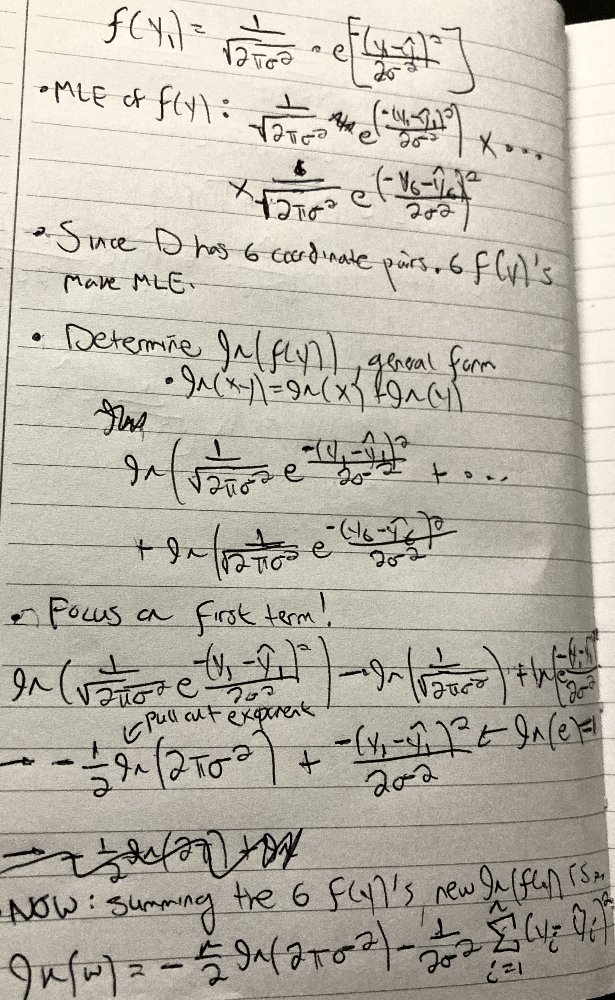

* With L(w) determined, we can then take the partial derivative of this function w.r.t. each weight, and plug it into the gradient descent formula for each weight (respectively). It is how we will make the update. Work for all three derivatives below, and the final gradient descent formulas for each weight (w0, w1, w2)
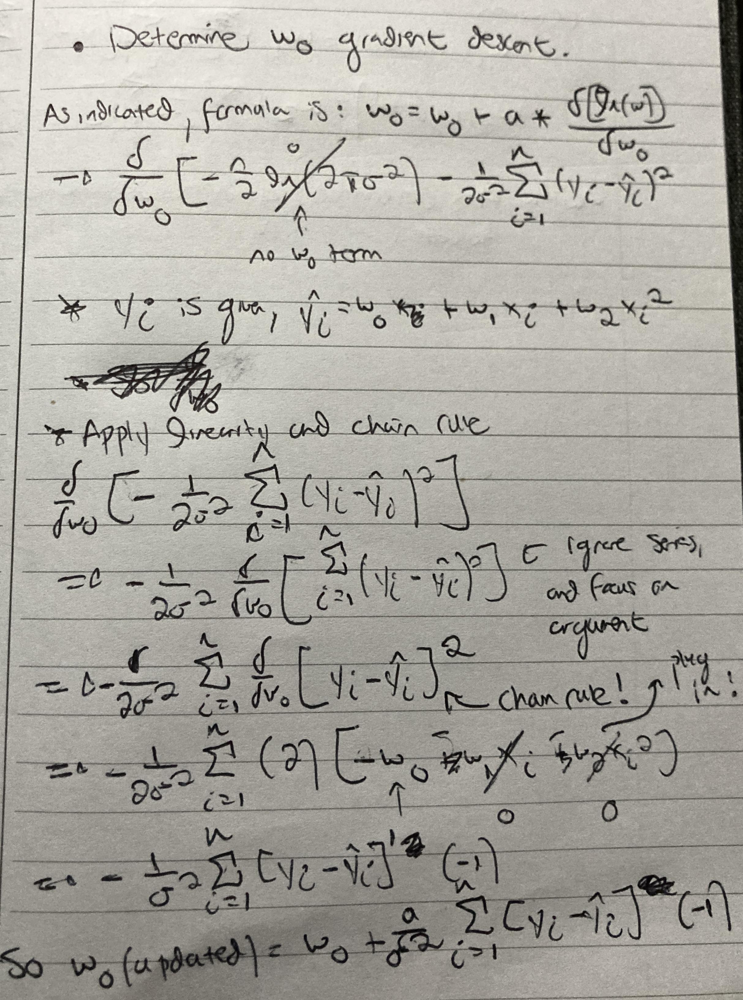
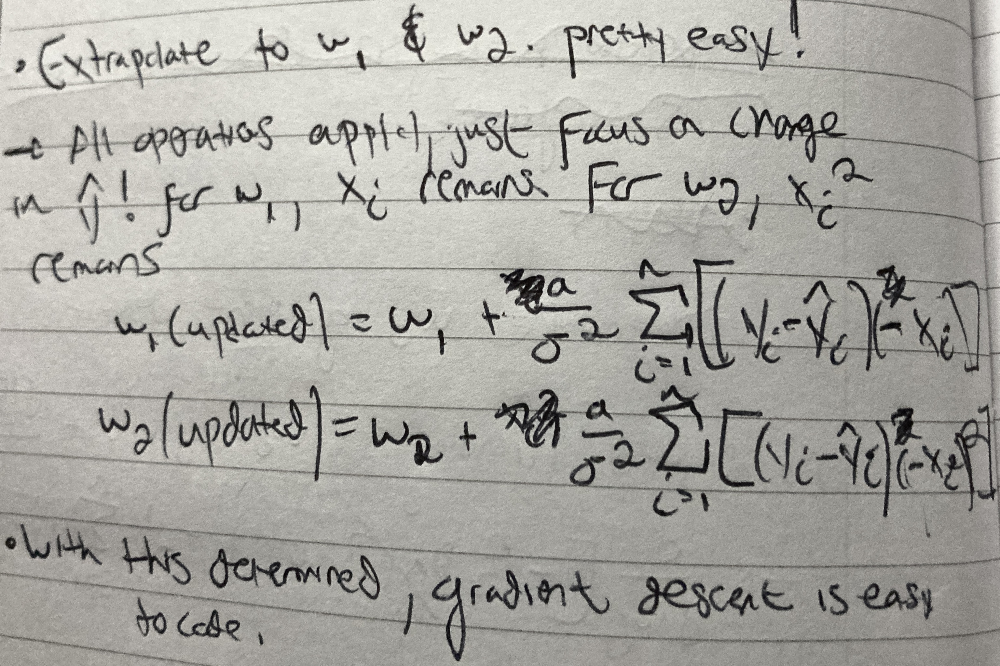
* We can now update our weights, and tabulate our findings

In [115]:
# For observation, record the log likelihoods from each particular actual vs. predicted y
# NOTE: this is the log likelihood for the given actual and predicted y. So there are 6 total. The logarithmic maximum likelihood estimation would be the sum of these.
log_likelihood = np.empty([6, 1])
for i in range(0, 6):
        log_likelihood[i][0] =  - ((1 / 2) * np.log(2 * np.pi * var)) - ((np.square(actual_y[i][0] - pred_y[i][0])) / (2 * var)) 

# Tabulate everything we have acquired so far. Add more columns to the DataFrame we created
feature_matrix_DF['Actual Y'] = actual_y
feature_matrix_DF['Predicted Y'] = pred_y
feature_matrix_DF['Log Likelihood'] = log_likelihood
print(feature_matrix_DF)

# Learning rate, and weights
a = 0.1
w_coeff = np.array([0.1, 0.2, 0.3])
# Run the weight update, from our hand-written findings
for i in range(0, 3):
    derivative = 0
    for j in range (0, 6):
        # Refer to hand-written notes. This is the "series" part of each gradient descent. Feature_matrix pulls out the relevant variable for each actual and predicted y, from dataset D
        derivative += (actual_y[j][0] - pred_y[j][0]) * -feature_matrix[j][i]
    # Finally, compute the entire gradient descent
    w_coeff[i] = w_coeff[i] -a * ((1 / var) * derivative)
    print(f"w{i}: {np.format_float_positional(w_coeff[i], precision = 2)}")


    x0   x1    x2  Actual Y  Predicted Y  Log Likelihood
0  1.0  3.0   9.0         2          3.4       -2.609718
1  1.0  5.0  25.0        12          8.6       -2.784998
2  1.0  8.0  64.0         8         20.9       -5.612304
3  1.0  7.0  49.0        10         16.2       -3.275782
4  1.0  4.0  16.0         4          5.7       -2.626698
5  1.0  2.0   4.0         2          1.7       -2.575574
w0: 0.03
w1: -0.31
w2: -3.65
